In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
# For data manipulation
import numpy as np
import pandas as pd

# For data visualization
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

# DL Libraries
import os
import random
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.utils import image_dataset_from_directory
from keras.optimizers import Adam

In [3]:
#generator
dataset = keras.utils.image_dataset_from_directory(
    directory = '/content/drive/MyDrive/dataset',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256),
)

Found 1944 files belonging to 15 classes.


In [4]:
# total number of records in the dataset
dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)
val_size = dataset_size - train_size

#spliting the data in training and validation
train_ds = dataset.take(train_size)
val_ds = dataset.skip(train_size).take(val_size)

#optimize data
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [5]:
# function is sepreted label and images
def dataset_to_tensors(dataset):
    images = []
    labels = []
    for img, lbl in dataset.unbatch():
        images.append(img.numpy())
        labels.append(lbl.numpy())
    return tf.convert_to_tensor(images), tf.convert_to_tensor(labels)

In [6]:
# x_train, y_train, x_test, y_test  dividing
x_train, y_train = dataset_to_tensors(train_ds)
#dataset_to_tensors is function where we seprate  images and label
x_test, y_test = dataset_to_tensors(val_ds)

[]

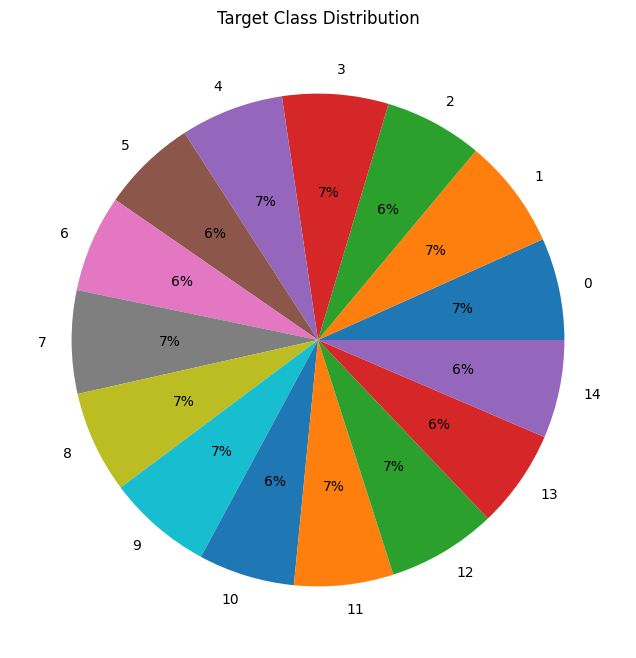

In [7]:
import os
unique, count=np.unique(y_train, return_counts=True)
plt.figure(figsize=(10, 8))
plt.pie(count, labels=unique, autopct='%.0f%%')
plt.title('Target Class Distribution')
plt.plot()

In [8]:
# Creating a function to visualize the images

def visualize_images(path, num_images=5):

    # Get a list of image filenames
    image_filenames = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]

    #if not image_filenames:
        #raise ValueError("No images found in the specified path")

    # Select random images
    selected_images = random.sample(image_filenames, min(num_images, len(image_filenames)))

    # Create a figure and axes
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3), facecolor='white')

    # Display each image
    for i, image_filename in enumerate(selected_images):
        # Load image
        image_path = os.path.join(path, image_filename)
        image = plt.imread(image_path)

        # Display image
        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(image_filename)  # Set image filename as title

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

In [9]:
# Extrating the class labels
classes = dataset.class_names
print(f'{classes}')

['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


BEAR


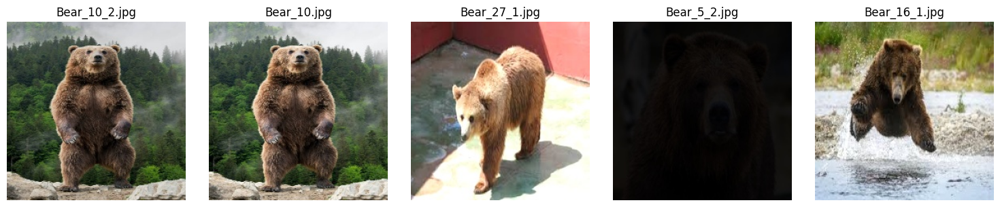

BIRD


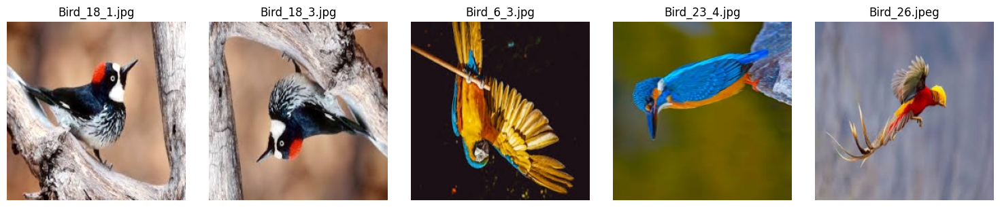

CAT


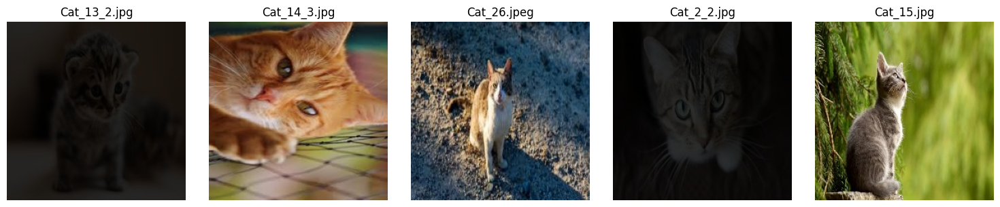

COW


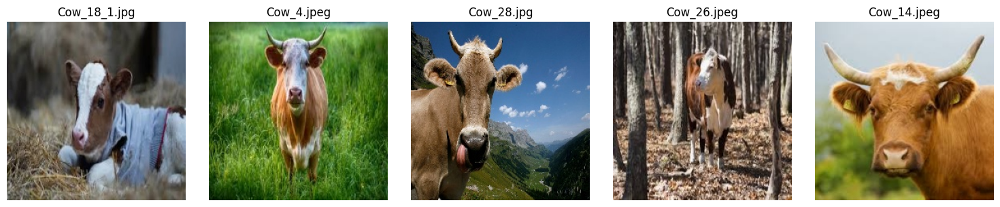

DEER


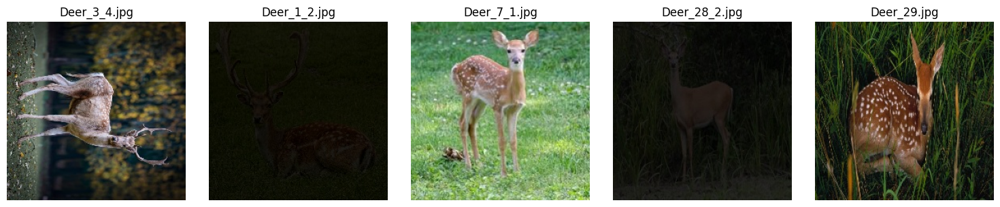

DOG


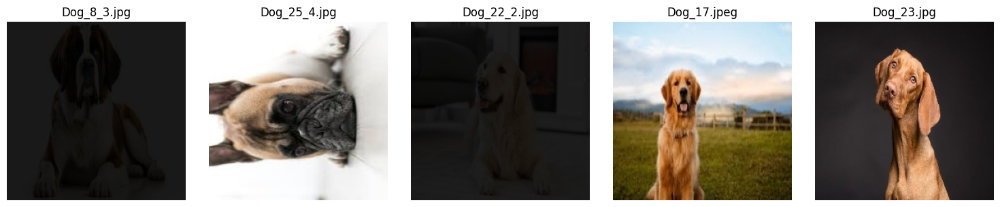

DOLPHIN


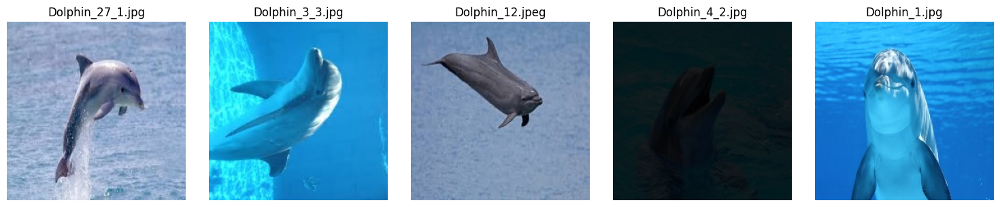

ELEPHANT


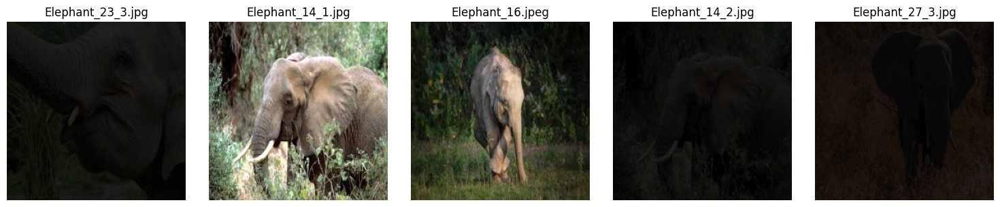

GIRAFFE


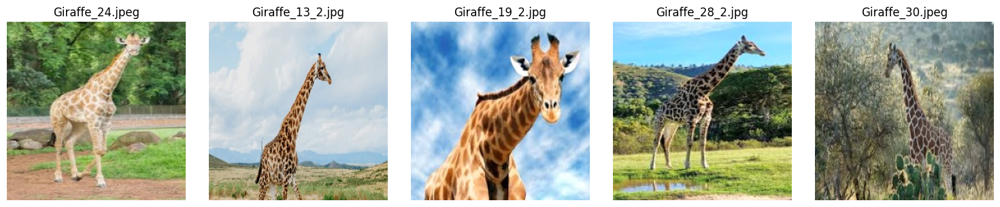

HORSE


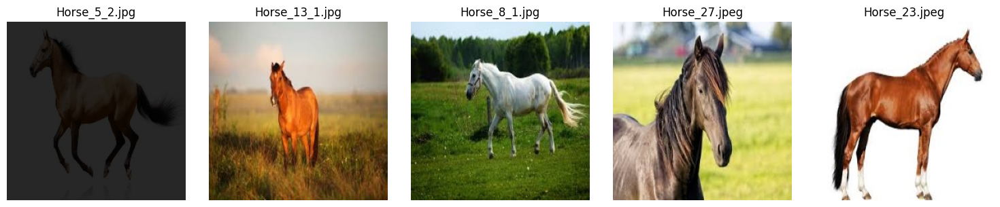

KANGAROO


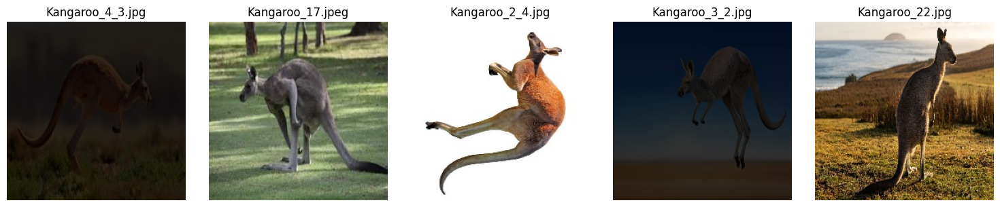

LION


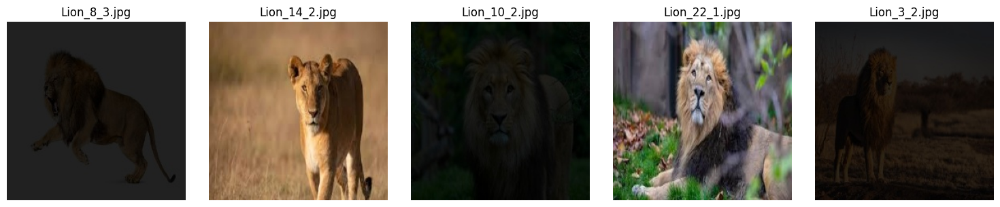

PANDA


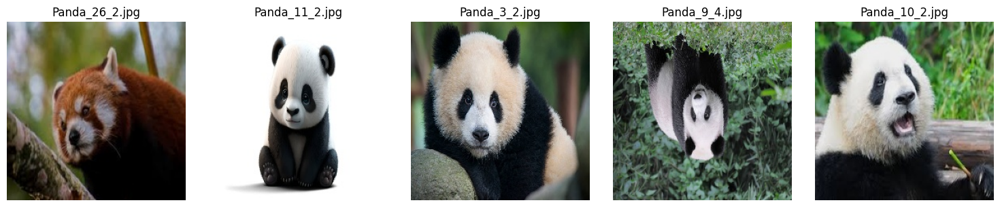

TIGER


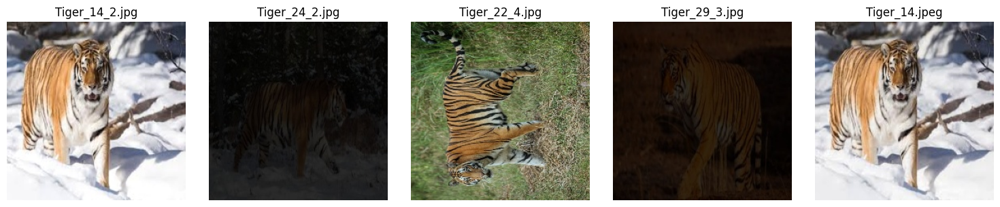

ZEBRA


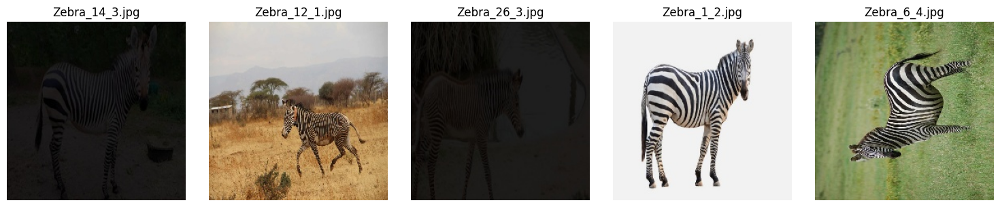

In [10]:
import os
# Iterating through each class to plot its images
for label in classes:
    # Specify the path containing the images to visualize
    path_to_visualize = os.path.join("/content/drive/MyDrive/dataset",label)

    # Visualize 5 random images
    print(label.upper())
    visualize_images(path_to_visualize, num_images=5)

**MIN MAX scaling**

In [11]:
# Convert the data type of the images to float32
x_train = tf.cast(x_train, tf.float32)
# tf.cast is used to convert the image tensors to float32.
x_test = tf.cast(x_test, tf.float32)

# Normalize the pixel values to a range between 0 and 1
x_train /= 255.0
x_test /= 255.0  #The pixel values of the images are normalized by dividing by 255.0.

# Print the shapes of the original training data and labels
print("X_train shape: {} \nY_train shape: {}".format(x_train.shape, y_train.shape))
print("X_test shape: {} \nY_test shape: {}".format(x_test.shape, y_test.shape))

X_train shape: (1536, 256, 256, 3) 
Y_train shape: (1536,)
X_test shape: (408, 256, 256, 3) 
Y_test shape: (408,)


Processing the Target variable

In [12]:
from tensorflow.keras.utils import to_categorical
# Convert class vectors to binary class matrices / one-hot encoding
y_train = to_categorical(y_train, 15)
y_test = to_categorical(y_test, 15)

In [13]:
y_train[3]

<tf.Tensor: shape=(15,), dtype=float32, numpy=
array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)>

**Define CNN Architecture**

In [14]:
# Define the CNN model
model = Sequential()
# Conv2D layer with 32 filters, kernel size 3x3, input shape (32, 32, 3)
# Input size: 32x32x3, Kernel size: 3x3, Number of kernels: 32, Output size: 30x30x32. [input_size-kernel]+1
model.add(Conv2D(92, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 15x15x32
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

#model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(84, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))




# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(54, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(54, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 6x6x64, Kernel size: 3x3, Number of kernels: 64, Output size: 4x4x64


# Flatten layer
# Output size: 1024
model.add(Flatten())
# Dense layer with 64 units
# Input size: 1024, Output size: 64
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
# Dense layer with 15 units (output layer)
# Input size: 256, Output size: 15

model.add(Dense(15, activation='softmax'))

In [15]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 92)   │         2,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 254, 254, 92)   │           368 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 92)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 127, 127, 92)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 84)   │        69,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 125, 125, 84)   │           336 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 84)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 62, 62, 84)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 64)     │        48,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 60, 60, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 54)     │        31,158 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 54)     │           216 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 54)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 14, 14, 54)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 12, 12, 54)     │        26,298 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 12, 12, 54)     │           216 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 6, 6, 54)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 6, 6, 54)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 4, 4, 64)       │        31,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 4, 4, 64)       │           256 │
│ (BatchNormalization)            │                        │             

 Total params: 263,299 (1.00 MB)

 Trainable params: 261,963 (1023.29 KB)

 Non-trainable params: 1,336 (5.22 KB)

In [16]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [17]:
# Train the model
history = model.fit(x_train, y_train, batch_size=32, epochs=120,
          validation_data=(x_test, y_test))

Epoch 1/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 41s 325ms/step - accuracy: 0.0634 - loss: 3.9956 - val_accuracy: 0.0735 - val_loss: 2.7532
Epoch 2/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 9s 183ms/step - accuracy: 0.0780 - loss: 3.5388 - val_accuracy: 0.0735 - val_loss: 2.9482
Epoch 3/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 9s 185ms/step - accuracy: 0.1175 - loss: 3.3146 - val_accuracy: 0.0735 - val_loss: 3.1439
Epoch 4/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 9s 183ms/step - accuracy: 0.1133 - loss: 3.1622 - val_accuracy: 0.0760 - val_loss: 3.1335
Epoch 5/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 9s 185ms/step - accuracy: 0.1343 - loss: 2.9341 - val_accuracy: 0.0784 - val_loss: 3.0237
Epoch 6/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 9s 186ms/step - accuracy: 0.1387 - loss: 2.9160 - val_accuracy: 0.0686 - val_loss: 3.0719
Epoch 7/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 9s 185ms/step - accuracy: 0.1752 - loss: 2.7597 - val_accuracy: 0.0809 - val_loss: 2.8400
Epoch 8/120
48/48 ━━━━━━━━━━━━━━━━━━━━ 9s 186ms/step - accuracy: 0.1721 - loss: 2.6623 - val_acc

In [18]:
# Evaluate the model
loss, accuracy = model.evaluate(x_test, y_test)
print('Test accuracy:', accuracy)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - accuracy: 0.8389 - loss: 0.6278
Test accuracy: 0.8308823704719543


In [19]:
pred = model.predict(x_test)

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step


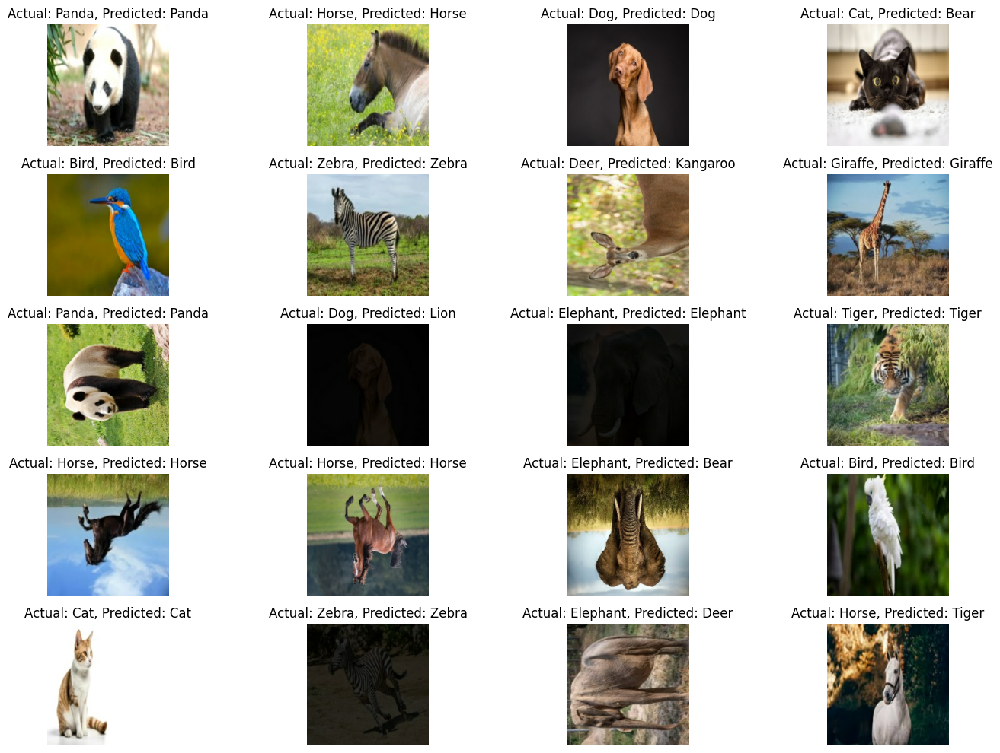

In [20]:
num_images_to_display = 20
num_columns = 4
num_rows = (num_images_to_display + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 10))
for i, ax in enumerate(axes.flat):
    if i < num_images_to_display:
        ax.imshow(x_test[i])
        actual_label = classes[np.argmax(y_test[i])]
        predicted_label = classes[np.argmax(pred[i])]
        ax.set_title(f"Actual: {actual_label}, Predicted: {predicted_label}")
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

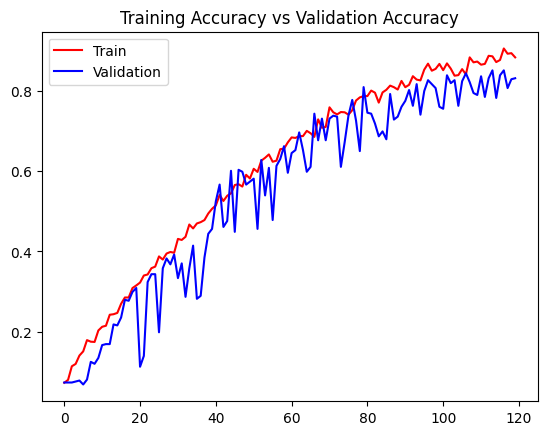

In [21]:
# Plotting the graph of Accuracy and Validation Accuracy
plt.title('Training Accuracy vs Validation Accuracy')

plt.plot(history.history['accuracy'], color='red',label='Train')
plt.plot(history.history['val_accuracy'], color='blue',label='Validation')

plt.legend()

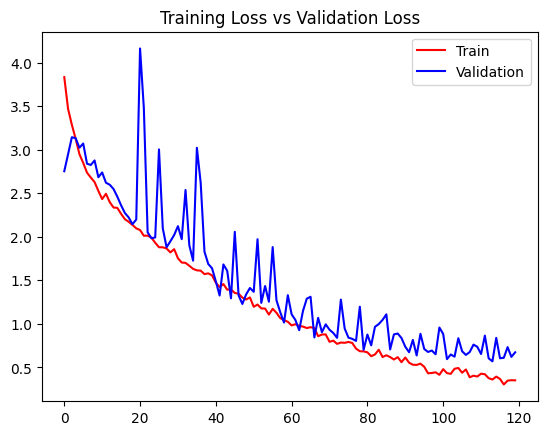

In [22]:
# Plotting the graph of Accuracy and Validation loss
plt.title('Training Loss vs Validation Loss')

plt.plot(history.history['loss'], color='red',label='Train')
plt.plot(history.history['val_loss'], color='blue',label='Validation')

plt.legend()